In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import scale

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
#from utility.util import configure_plots
#from utility.util_hw import squared_distance
from sklearn.neighbors import KNeighborsRegressor
from ydata_profiling import ProfileReport
#configure_plots()

# Homework 11: Predictive Modelling and Model Comparision

Name: La'Mia Crutchfield and Dominique Bradshaw

Student ID: 508344

Collaborators:


## Instructions

This is the final homework/Project, which is about Understanding Data Profiling, Feature Engineering, Feature Selection, Model Comparision & Selection as a _final project_ for our 217a class.

We will be using the techniques and approaches introduced throughout the course focusing mainly towards the second half of the semester:

* [M0] Python for DS
* [M1] The DS and ML Workflows
* [M2] Exploratory Data Analsyis
* **[M3] Linear Regression (if applicable - depends on problem/dataset)**
* **[M4] Linear Classification (if applicable - depends on problem/dataset)**
* [M5] Sentiment Analysis (if applicable - depends on problem/dataset)
* [M6] Ethical Thinking for Data Science (if applicable - depends on problem/dataset)
* **[M7] Performance Evaluation: Overfitting & Cross-Validation**
* **[M8] Clustering K-Means (if applicable - depends on problem/dataset)** 
* **[M9] Similarity-based Learning K-NN (if applicable - depends on problem/dataset)**
* **[M10] More Models (Decision Tree, Random Forest, Neural Network) for Feature Engineering & Model Comparision & Selection**
* **[M11] DS Workflow in Python: Data Profiling and ML Pipelines**

The main focus of this project is majorly on the last modules [M7]-[M11]. In particular, it will be helpful to review **Lab 3 & hw 3 onwards for more clarification**.
Most of the things you will do in this final project are explained in `Lab10` and `Lab11`. Then, review the other labs and hws to recap the general workflow of our DS approaches to the various problems we have worked on so far. This will help you to be prepared for all the steps in this project, so that you do not miss anything. 

In gernal, you should feel free to import any package that we have previously used in class. Ensure that all plots have the necessary components that a plot should have (e.g. axes labels, a title, a legend).

Additionally, note that this assignment is more like a project than a typical homework and it will have a slightly different structure than the hws in the past. One of the reasons why Jupyter Notebooks are so popular in the field is because you can really treat them like notebooks to explain your findings as you discover them. In this assignment, we provide some **Problem** stubs following the DS workflow and you will need to fill in the analysis and structure as you go.

Furthermore, in addition to recording your collaborators on this homework, please also remember to cite/indicate all external sources used when finishing this assignment. This includes peers, TAs, and links to online sources. 

Frequently **save** your notebook!

### Collaborators and Sources
Furthermore, in addition to recording your **collaborators** on this homework, please also remember to **cite/indicate all external sources** used when finishing this assignment. 
> This includes peers, TAs, and links to online sources. 

Note that these citations will not free you from your obligation to submit your _own_ code and write-ups, however, they will be taken into account during the grading and regrading process.

In [2]:
# collaborators and sources:
# Albert Einstein and Marie Curie
# https://developers.google.com/edu/python/strings

# your code here
answer = 'my answer'

### Submission instructions
* Submit this Python notebook, including your answers in the code cells as homework submission.
* **Feel free to add as many cells as you need to** — just make sure you don't change what we gave you. 
* **Does it spark joy?** Note that you will be partially graded on the presentation (_cleanliness, clarity, comments_) of your notebook so make sure you [Marie Kondo](https://lifehacker.com/marie-kondo-is-not-a-verb-1833373654) your notebook before submitting it.

## 1. Introduction

For our final project this semester, we'll take a look at data for Melbourne Housing Price Prediction
https://www.kaggle.com/datasets/dansbecker/melbourne-housing-snapshot.


As you have seen throughout the semseter we have learned various techniques to solve a problem task (Classification, Regression, Clustering etc.) starting from problem formulation to EDA to model building to model evaluation and performing feaure engineering and selection in order to improve the model's performance.
You will be combining all the knowledge learned so far in this final project. You will be making assuptions and decisions on your own with appropriate justifications in writeups about how to improve the prediction model using all the tools and techniques learned so far and provide the best model at the end.


The project aims at building a model of housing prices to predict median house values in Melbourne using the provided dataset. This model should learn from the data and be able to predict the median housing price in any district, given all the other metrics.

Our goal will be to use this dataset to gain some insight about characteristics of different features.
We will be using data profiling from pandas and create models (hopefully more than 3) and compare them to find out which model performed the best and probably explain why it is the best model among all in this data.


### Problem 1.1

Download the data and load it in this notebook for further processing and analysis.

In [3]:
# BEGIN SOLUTION

housing = pd.read_csv("./utility/data/melb_data.csv")
features = housing.columns
housing.shape
housing.head
#housing.describe()
#housing.info()
housing.columns

# END SOLUTION

Index(['Suburb', 'Address', 'Rooms', 'Type', 'Price', 'Method', 'SellerG',
       'Date', 'Distance', 'Postcode', 'Bedroom2', 'Bathroom', 'Car',
       'Landsize', 'BuildingArea', 'YearBuilt', 'CouncilArea', 'Lattitude',
       'Longtitude', 'Regionname', 'Propertycount'],
      dtype='object')

**Write-up!** Describe the data, answering questions including, but not limited to, these: Where does the data come from? How was it obtained? How many examples and features does the dataset have? What kinds of features are in the dataset? What values can these features take? What kind of data science problem is this? What application area does the dataset fall into? What kind of prediction (regression, classification or clustering) we are doing with this dataset and why?
> **Hint**: Recall, our goal is to build a model of housing prices to predict median house values.

**Your Answer Here:**
The data comes from Tony Pino, the creator of the dataset, who scraped from pubicly available results posted every week from Domain.com.au. There are 13580 examples with 21 features. The examples represent individual property transactions. The features consist of the location (Suburb, Address, Latitude, Longitude, Distance, Postcode, Regionname, CouncilArea), housing aspects (Number of rooms, price, type of home, nunmber of bathrooms, Building Area, YearBuilt, Propertycount). The features are both categorical and numerical. The categorical features consist of Suburb, Address, Type, Method, SellerG, CouncilArea, and Regionname. The numerical features consist of rooms, price, distance, postcode, bedroom2, bathroom, car, landsize, building area, yearbuilt, latitidue, longitude, and propertycount). This is a regression problem because we are aiming to predict median house values in Melbourne, The target variable is "Price," which represents the median housing prices in Melbourne. The application area for this dataset is the real estate domain, specifically housing prices in Melbourne, Austrailia. The prediction "Price" is a continuous numerical value, making it a regression prediction suitable for regression analysis. We need to analyze and understand the relationship between the features and the price. 

### Problem 1.2: Getting Familiar with the Data

Generate the data report using __ProfileReport__ as we did in lab 11.

In [4]:
# BEGIN SOLUTION

ProfileReport(housing)

# END SOLUTION

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Problem 1.3: Data Description

**Write-up!** What are the major highlights and interesting aspects in the report generated in the previous cell (or in your own EDA process). 
Describe your insights using the data/features/visualizations/statistics. Be sure to consider the relationship among features such as correlation and interaction, as well as distributions, missing data, outliers. Include additional visualizations as necessary.

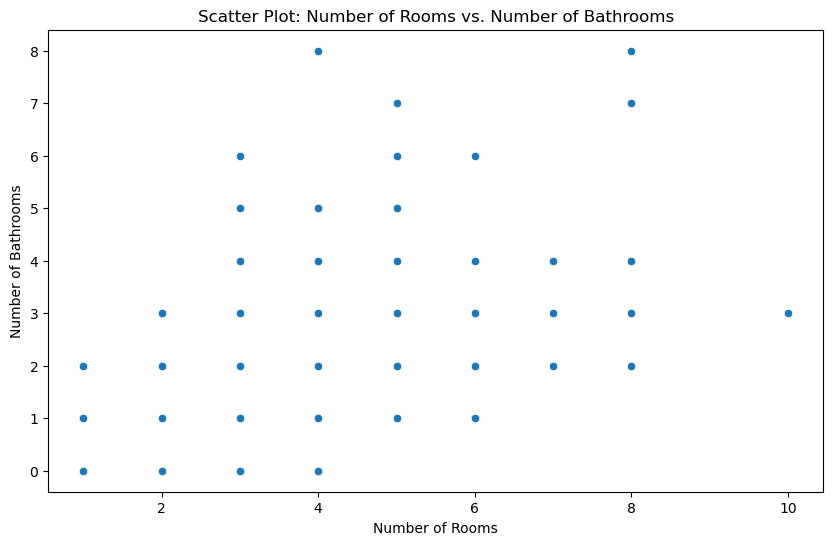

In [5]:
# BEGIN SOLUTION
from matplotlib import style
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
rooms_bathrooms_data = housing[['Rooms', 'Bathroom']]

plt.figure(figsize = (10,6))
sns.scatterplot(x='Rooms', y = 'Bathroom', data = rooms_bathrooms_data)
plt.title('Scatter Plot: Number of Rooms vs. Number of Bathrooms')
plt.xlabel('Number of Rooms')
plt.ylabel('Number of Bathrooms')
plt.show()
# END SOLUTION

In [6]:
correlation_coefficient = rooms_bathrooms_data['Rooms'].corr(rooms_bathrooms_data['Bathroom'])
print(f'Correlation Coefficient between Rooms and Bathrooms: {correlation_coefficient:.2f}')


Correlation Coefficient between Rooms and Bathrooms: 0.59


In [7]:
missing_data = housing.isnull().sum()
print(missing_data)

Suburb              0
Address             0
Rooms               0
Type                0
Price               0
Method              0
SellerG             0
Date                0
Distance            0
Postcode            0
Bedroom2            0
Bathroom            0
Car                62
Landsize            0
BuildingArea     6450
YearBuilt        5375
CouncilArea      1369
Lattitude           0
Longtitude          0
Regionname          0
Propertycount       0
dtype: int64


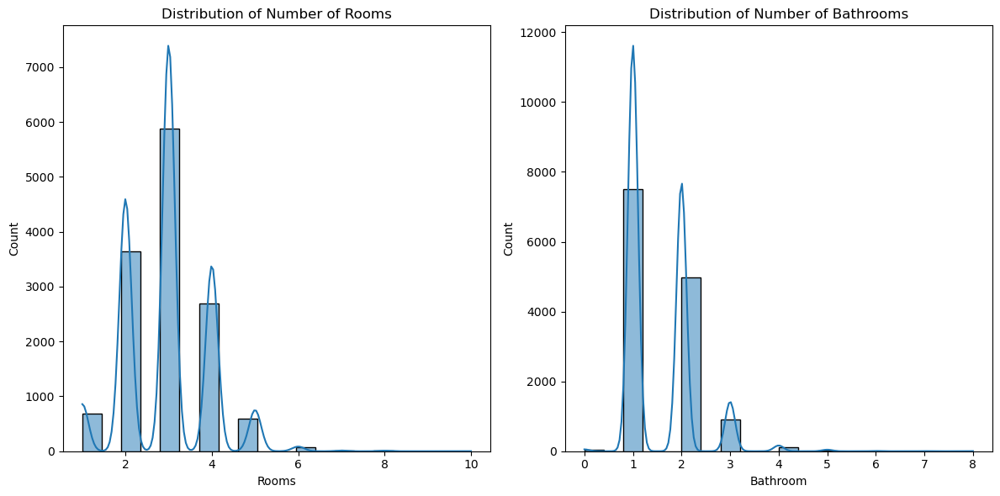

In [8]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.histplot(rooms_bathrooms_data['Rooms'], bins=20, kde=True)
plt.title('Distribution of Number of Rooms')

plt.subplot(1, 2, 2)
sns.histplot(rooms_bathrooms_data['Bathroom'], bins=20, kde=True)
plt.title('Distribution of Number of Bathrooms')

plt.tight_layout()
plt.show()

**Answer here:** (feel free to make multiple cells!)

We wanted to focus on the relationship between rooms and bathrooms as they showed a relatively positive correlation of 0.59. 
The “Rooms” asymmetric histogram has high correlation with a min of 1 and a max of 10. The mean amount of rooms is approximately 2.938. The “Price” histogram shows a right skew with a min of $85,000 and a max of $9,000,000. The mean housing price is $1,075,684.10. The “Distance” histogram is skewed to the right with a min of 0 and a max of 48.1. The mean distance is 10.13776. The mean “Bedroom2” is approximately 2.915. The mean “Bathroom” is approximately 1.534. The range for “YearBuilt” is 1196 to 2018. The mean year a house was built is 1964.

The “Price” target variable has positive correlations with several features, such as “Rooms” (0.540), “Bedroom2” (0.524), “BuildingArea” (0.631), and “Bathroom” (0.427). Other feature relationships with positive correlations include: “Longitude” and “Postcode” (0.680), “BuildingArea” and “Bathroom” (0.651), “Rooms” and “Bathrooms” (0.587), “Bedroom2” and “Bathroom” (0.580), “Longitude” and “Regionname” (0.574), “Postcode” and “Region” (0.544), “Landsize” and “Rooms” (0.486), “Bedroom2” and “Landsize” (0.480), “Car” and “Bedroom2” (0.477), “Car” and “Rooms” (0.476), “Car” and “BuildingArea” (0.472), “BuildingArea” and “Landsize” (0.471), “Type” and “Rooms” (0.457), “Latitude” and “Regionname” (0.449), “Distance” and “Regionname” (0.448) as well as a few more with lower numbers ranging from 0.440 to 0.350. These other relationships show no true significance. 

Features with high positive correlation, such as “Bedroom2” and “Rooms” (0.960), suggest redundancy as they convey the same information. The two features could be combined into a new feature for total bedrooms. “Regionname” and “CouncilArea”  (0.804) also show high positive correlation as well as “BuildingArea” and “Bedroom2” (0.762) and “BuildingArea” and “Rooms” (0.775).

The “Price” variable has negative correlations with “Latitude” (-0.260) and “YearBuilt” (-0.368).  “Latitude” and “Postcode” (-0.588) and “Latitude” and “Longitude” (-0.356) also have negative correlations. 

The dataset contains 3 relationships that show no linear correlation at all: “BuildingArea” and “Type” (0.000), “Landsize” and “Type” (0.000), and “BuildingArea” and “Method” (0.000).

The dataset contains missing values in features like “BuildingArea” (7130 examples), “YearBuilt” (8205 examples) and “CouncilArea” (12211 examples).



### Problem 1.4: Split the Data

Extract input (X) and output (y) data from the dataset. 

Use the train and test split from the scikit learn library to split the data into 80% training and 20% testing.

Then, initalize the Kfolds. Be sure to use these folds when executing cross validation below so that the results are comparable.

In [9]:
# BEGIN SOLUTION

from sklearn.model_selection import train_test_split, KFold
X = housing[['Rooms', 'Bathroom']]  # Features
y = housing['Price']  # Target variable

# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.2, random_state=42)

# Initialize KFolds
num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True, random_state=24)

# END SOLUTION

**Write-up!** Why 80% train and 20% test split is considered a good practice? How would you pick the train-test split size if the dataset is relatively small or large? What is the purpose of using cross validation technique and how does it ensure model robustness? What is Data snooping and how do you avaoid it?

**Answer here:** (feel free to make multiple cells!)
The 80% train and 20% test split, which is 80% of training data used to train the model and 20% testing data used to asses the model's generalizattion on new, unseen data, is considered a good practice because it creates a balance between having enough data to train a good, reliable model and having enough unseend data to analyze the model's performance accurately. The 80/20 split is commonly used but the split can differ based on whether the dataset is small or large, the complexity of the model, and the problem domain. 

For larger datasets, an 80/20 split provides a good amount of data for training, but for smaller datasets, a bigger training set might be more beneficial to ensure tha tthe model has enough data to learn significant patterns. Vice versa, a significantly large dataset may need a smalller training set to still evaluate the model efficiently without sacrificing the model's performance. 

Cross-validation is used to asses the model's performance and ensure its robustness. Cross-validation invloves splitting the dataset into multiple folds, training the model on different combinations of these folds, and evaluating its performance on the remanining data, rather than relying on a single train-test split. This helps to make sure that the model's performance is consistent across different subsets of the data, giving a more trustworthy estimate of the model's ability to adapt properly to new, unseen data. 

Data snooping is the situation in which information from the test set spills into the training process, causing an overfitted evaluation of the model's performance. To avoid data snooping, one must maintain a clear separation between the training and dataset. This can be achieved with cross-validation by using mulitple folds for training and testing, keeping the model from learning patterns specific to a specific subset of the data. 

## Problem 2: Preprocessing and Baseline Models

### Problem 2.1: Preprocessing for the Baseline Models

Let's start by preprocessing the data so that we can train some baseline models. Note that categorical variables will need to be encoded and missing values should be appropriately delt with using imputation. Also, some models may require scaling. Imputation and scaling should be done in a manner that aovids data snooping.
> Hint: The use of Scikit-Learn's Pipelines are highly encouraged!

In [10]:
# BEGIN SOLUTION

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
 
numerical_cols = X.select_dtypes(include=['number']).columns
categorical_cols = X.select_dtypes(include=['object']).columns

numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),  
    ('scaler', StandardScaler())  
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),  
    ('onehot', OneHotEncoder(handle_unknown='ignore'))  
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

X_train_cleaned = preprocessor.fit_transform(X_train)

X_test_cleaned = preprocessor.transform(X_test)



# END SOLUTION

### Problem 2.2: Perform Linear Regression

Perform Linear Regression on training data. Predict the output for the test dataset using the fitted model. Print the root mean squared error (RMSE) and R^2 value from Linear Regression for test data set.


In [11]:
# BEGIN SOLUTION
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

model = LinearRegression()
model.fit(X_train_cleaned, y_train)

y_pred = model.predict(X_test_cleaned)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f'Root Mean Squared Error (RMSE): {rmse:.2f}')
print(f'R^2 Value: {r2:.2f}')


# END SOLUTION

Root Mean Squared Error (RMSE): 524629.47
R^2 Value: 0.31


**Write-up!** What does R^2 tell us about the model's performance? What does RMSE tell us about the model's performance?

**Answer here:** (feel free to make multiple cells!) The R-Squared value measures how well the features explain the changeability, or "variability" of the target variable. The R-Squared value ranges from 0 to 1, where 0 means that the model doesn't explain any variability, and 1 means that the model explains all, or majority, of the variability. A higher R^2 value indicates better performance because it means that a larger proportion of the variability in the target variable is accounted for by the model. Our model's R^2 value of 0.31 indicates that around 31% of the variability in the target variable is explained by the feaetures in the model. 

The RMSE measures the average amount of the errors between predicted and actual values, giving an idea of how spread out the differences are. RMSE is found by taking the square root of the average of the squared differences between predicted and actual values. A lower RMSE indicates better performance becuase it means that the model's predictions are within closer proximity of the actual values. Our model's RMSE value of 524629.47 suggest that the model's predictions have an error of approximately 524629.47 units, indicating more errors and less precise predictions. 

### Problem 2.3 : Perform K-Nearest Neighbors Regression

Perform K-Nearest Neighbors Algorithm for Regression using cross validation to tune any hyperparameters, such as `n_neighbors`.

Then, using the optimal hyperparameters, train a K-Nearest Neighbors Regressor on the entirety of the training data and predict output for the test dataset using the fitted model.

Print root mean squared error (RMSE) and R^2 from K-Nearest Neighbors Regression on the test datset.

In [12]:
# BEGIN SOLUTION
from sklearn.model_selection import cross_val_score

neighbors_range = [1, 5, 7, 9]

rmse_scores = []
for n_neighbors in neighbors_range:
    knn_model = KNeighborsRegressor(n_neighbors=n_neighbors)
    cv_scores = cross_val_score(knn_model, X_train_cleaned, y_train, cv=5, scoring='neg_mean_squared_error')
    rmse_scores.append(np.sqrt(-cv_scores.mean()))

# Find the optimal number of neighbors
optimal_neighbors = neighbors_range[np.argmin(rmse_scores)]

# Train KNN model on the entire training data using the optimal number of neighbors
final_model = KNeighborsRegressor(n_neighbors=optimal_neighbors)
final_model.fit(X_train_cleaned, y_train)

# Apply the same preprocessing to the testing data
X_test_cleaned = preprocessor.transform(X_test)

# Predict the output for the test dataset
y_pred = final_model.predict(X_test_cleaned)

# Calculate RMSE and R^2
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f'Optimal Number of Neighbors: {optimal_neighbors}')
print(f'Root Mean Squared Error (RMSE): {rmse:.2f}')
print(f'R^2 Value: {r2:.2f}')
# END SOLUTION


# END SOLUTION

Optimal Number of Neighbors: 9
Root Mean Squared Error (RMSE): 527029.81
R^2 Value: 0.30


**Write-up!** How K-NN is different than Linear regression model and what additional steps you have to take for KNN Regression?

**Answer here:** (feel free to make multiple cells!)
K-NN and Linear Regression are both supervised leaning algorithms with fundamental differences in their approach. A K-NN model predicts the contiuous value of a target variable based on the weighted average of the values of its k-nearest neighbors. A Linear Regression model predicts a continuous target variable based on one or more features through an assumed linear relationship between the variables (target and features).

The differences between the K-NN model and Linear Regression model are:
    K-NN: The K-NN model makes predicitons based on the average of the k-nearest neighbors in the feature space without assuming a functional form for the relationship. K-NN stores the whole training dataset and makes predictions based on the closeness of new data to existing data in the feature space. The predictions are made based on the similarity of data points. Also, the model's decision boundary is not as easy to read as a linear equation in a Linear Regression model.
    Linear Regression: Linear regression assumes a linear relationship between the features and target variable. It uses a linear equation to fit the data. Linear Regression estimates coefficients that minimize the sum of squared differences between predicted and actual values. The coefficients in a Linear Regression model have clear interpretations as they represent the change in the target variables corresponding to a one-unit change in the features. 
    
Additional Steps for KNN Regression:
    K-NN uses feature scaling, which is a technique used to change the values of features to a similar scale to ensure that all features contribute equally to the model and avoid the overuse of features with larger values. K-NN also changes the number of k-neighbors as a hyperparameter, increasing its ability to capture complex patterns. Lastly, K-NN uses a distance metric (Euclidean, Manhattan), which affects the models performance.

### Problem 2.4 : Perform Decision Tree Regression 

Perform Decision Tree Regression using cross validation to tune any hyperparameters, such as `max_depth`.

Then, using the optimal hyperparameters, train a Decision Tree Regressor on the entirety of the training data and predict output for the test dataset using the fitted model.

Print root mean squared error (RMSE) and R^2 from Decision Tree Regression on the test dataset.

In [13]:
# BEGIN SOLUTION

from sklearn.tree import DecisionTreeRegressor

max_depth_range = [None, 5, 10, 15]

# Perform cross-validation to find the optimal value of max_depth
rmse_scores = []
for max_depth in max_depth_range:
    dt_model = DecisionTreeRegressor(max_depth=max_depth)
    cv_scores = cross_val_score(dt_model, X_train_cleaned, y_train, cv=5, scoring='neg_mean_squared_error')
    rmse_scores.append(np.sqrt(-cv_scores.mean()))

# Find the optimal value of max_depth
optimal_max_depth = max_depth_range[np.argmin(rmse_scores)]

# Train Decision Tree model on the entire training data using the optimal value of max_depth
final_model = DecisionTreeRegressor(max_depth=optimal_max_depth)
final_model.fit(X_train_cleaned, y_train)

# Apply the same preprocessing to the testing data
X_test_cleaned = preprocessor.transform(X_test)

# Predict the output for the test dataset
y_pred = final_model.predict(X_test_cleaned)

# Calculate RMSE and R^2
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f'Optimal Max Depth: {optimal_max_depth}')
print(f'Root Mean Squared Error (RMSE): {rmse:.2f}')
print(f'R^2 Value: {r2:.2f}')



# END SOLUTION

Optimal Max Depth: 5
Root Mean Squared Error (RMSE): 518594.44
R^2 Value: 0.32


**Write-up!** What are the advantages or disadvantages of using Decision Tree over Linear Regression and KNN?

**Answer here:** (feel free to make multiple cells!)
Decision Tree Regression is used to predict continuous values by recursively partitioning the data into subsets based on the features' values, creating a tree-like structure. The target variable is predicted by the mean of the targe values within the last leaf nodes. 

Advantages:
    Decision Tree Regression models can model complex nonlinear relationships within a dataset, making it more fitting for problems where the relationship between features and the target variable isn't linear.
    Decision Trees are easy to interpret as decision rules are easily vizualized and explicitly portrayed in a tree strucutre.
    Decision Trees can deal with both numerical and categorical data without issue or need for preprocessing.
    Decision Trees are less likely to be significantly affected by outliers compared to linear models because they make decisions based on majority, decreasing the impact of outliers.
   
Disadvantages:
    Due to its ability to model complex nonlinear relationships, the Decision Tree can easily be overfitted. 
    Small changes in the dataset can lead to a completely different tree structure, so Decision Trees aren't very stable.
    Decision Trees may have trouble expressing complex relationships that involve interactions between features rather than just features and target variable.

### Problem 2.5 : Perform Random Forest Regression

Perform Random Forest Regression using cross validation to tune any hyperparameters, such as `n_estimators`.

Then, using the optimal hyperparameters, train a Random Forest Regressor on the entirety of the training data and predict output for the test dataset using the fitted model.

Print root mean squared error (RMSE) and R^2 from Random Forest Regression on the test dataset.

In [14]:
# BEGIN SOLUTION
from sklearn.ensemble import RandomForestRegressor

n_estimators_range = [50, 100, 150]

rmse_scores = []
for n_estimators in n_estimators_range:
    rf_model = RandomForestRegressor(n_estimators=n_estimators)
    cv_scores = cross_val_score(rf_model, X_train_cleaned, y_train, cv=5, scoring='neg_mean_squared_error')
    rmse_scores.append(np.sqrt(-cv_scores.mean()))

optimal_n_estimators = n_estimators_range[np.argmin(rmse_scores)]

final_model = RandomForestRegressor(n_estimators=optimal_n_estimators)
final_model.fit(X_train_cleaned, y_train)

X_test_cleaned = preprocessor.transform(X_test)

y_pred = final_model.predict(X_test_cleaned)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f'Optimal Number of Estimators: {optimal_n_estimators}')
print(f'Root Mean Squared Error (RMSE): {rmse:.2f}')
print(f'R^2 Value: {r2:.2f}')


# END SOLUTION

Optimal Number of Estimators: 100
Root Mean Squared Error (RMSE): 519945.22
R^2 Value: 0.32


**Write-up!** Why does a Random Forest ensure better results than a single Decision Tree? 

**Answer here:** (feel free to make multiple cells!)
Random Forest Regression is an algorithm that builds a collection of Decision Trees and finds the mean of their predicitions for improved accuracy and generalization. It can be used for both classification and regression tasks. 

Random Forest Regression ensures better results than a single Decision Tree because it reduces overfitting with multiple trees of different subsets of data before finding the mean of their prediction, creating a better generalization of new, unseen data. Also, a Random Forest reduces the sensitivity to training data and outliers that a single Decision Tree would have, producing a more reliable and stable model. Also, there is a reduced risk of overfitting.
    

## 3. Feature Selection And Extraction

### Problem 3.1: Feature Selection

Perform Feature **selection** in this section (Statistical, Model-based, or Iterative Feature Selection). Be sure to apply the same Feature Selection to both the training and testing datasets.

**Do this!** In the cells below, **explain** and perform the steps necessary for feature selection. Make sure that your implementations and write-ups are presented well and effectively describe your workflow. You may add comments or markdown cells for your documentation as you see fit!  

*Grading Note: Your work will be graded for _readability_, _style_, and _cleanlines_. So, carefully document your code and use descriptive/intuitive variable names. For write-ups use consice and clear language like in a written project report.*

> **Hint**: You can use our previous labs as examples of how you might do this. Remember, you may add as many cells (for code and text) as you need below. Here — we gave you one for free!

In [15]:
# BEGIN SOLUTION
from sklearn.feature_selection import SelectFromModel

# Create a RandomForestRegressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

# Fit the model on the training data
rf_model.fit(X_train_cleaned, y_train)

# Use SelectFromModel to perform feature selection
sfm = SelectFromModel(rf_model, threshold='median')
X_train_selected = sfm.fit_transform(X_train_cleaned, y_train)

# Get the selected feature indices
selected_feature_indices = sfm.get_support(indices=True)

# Get the names of the selected features
selected_feature_names = X.columns[selected_feature_indices]


# END SOLUTION

**Write up** Explain which feature selection method have you selected and why.

**Your Answer Here:**

We have decided to use Random Forest Regression with 100 trees and a random seed for reproducibility. RandomForestRegressor was used because it emphasizes the contribution of all/each feature to the model's predicted performance (feature importance). With the use of 'SelectFromModel', we were able to set a threshold to select features based on their importance scores. It is best to use this model when it is believed that particular features may be more impactful/informative than others in the predictive modeling process.

### Problem 3.2: Feature Extraction

Apply Feature **Extraction** in this section in order to derive at least 2 new features. Be sure to apply the same feature extraction to both the training and testing datasets.

**Do this!** In the cells below, **explain** and perform the steps for feature extraction. Make sure that your implementations and write-ups are presented well and effectively describe your workflow. You may add comments or markdown cells for your documentation as you see fit!  

*Grading Note: Your work will be graded for _readability_, _style_, and _cleanlines_. So, carefully document your code and use descriptive/intuitive variable names. For write-ups use consice and clear language like in a written project report.*

> **Hint**: You can use our previous labs as examples of how you might do this. Remember, you may add as many cells (for code and text) as you need below. Here — we gave you one for free!

In [16]:
# BEGIN SOLUTION
from sklearn.decomposition import PCA

# Create a PCA transformer
pca = PCA(n_components=2)  # Choose the number of components

# Apply PCA to the training data
X_train_pca = pca.fit_transform(X_train_cleaned)

# Apply the same preprocessing and PCA to the testing data
X_test_cleaned = preprocessor.transform(X_test)
X_test_pca = pca.transform(X_test_cleaned)


# END SOLUTION

**Write up** Explain the feature extraction/generation methods have you implemented and why.

**Your Answer Here:**
We have decided to use Principal Component Analysis (PCA) for feature extraction, in which we reduce the original features into a new set of uncorrelated features, or principal components. We wanted to make at least 2 new features from the original set. PCA finds the directions in which the data has the most changability. By reducing the number of components to 2, we allowed the data to be visua;ized in a 2D sense, retaining the most important information. We did this to reduce noise in the data as well as possibly reveal hidden patterns. 

## Problem 4: Preprocessing and Feature Engineered Models

### Problem 4.1: Preprocessing for the Feature Engineered Models

Now that we've removed/added features during feature engineering, we need to update the preprocessing from Problem 2.1. 

In [17]:
# BEGIN SOLUTION
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA

# Identify numerical and categorical columns
numerical_cols = X.select_dtypes(include=['number']).columns
categorical_cols = X.select_dtypes(include=['object']).columns

# Create transformers for numerical and categorical features
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),  # Impute missing values with mean
    ('scaler', StandardScaler())  # Scale numerical features
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),  # Impute missing values with most frequent
    ('onehot', OneHotEncoder(handle_unknown='ignore'))  # One-hot encode categorical features
])

# Create a preprocessor that applies transformations based on data types
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])




# Apply preprocessing to the training data
X_train_cleaned = preprocessor.fit_transform(X_train)

#Convert feature names to strings
features = [str(i) for i in range(X_train_cleaned.shape[1])]
X_train_cleaned = pd.DataFrame(X_train_cleaned, columns=features)



# Feature Extraction (PCA) - Assume 'num_pca1' and 'num_pca2' are the names of the extracted features
pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train_cleaned)

# Add the extracted features to the training data
X_train_final = pd.concat([pd.DataFrame(X_train_cleaned), pd.DataFrame(X_train_pca, columns=['num_pca1', 'num_pca2'])], axis=1)

# Apply the same preprocessing and feature extraction to the testing data
X_test_cleaned = preprocessor.transform(X_test)
X_test_cleaned = pd.DataFrame(X_test_cleaned, columns=features)
X_test_pca = pca.transform(X_test_cleaned)





# Add the extracted features to the testing data
X_test_final = pd.concat([pd.DataFrame(X_test_cleaned), pd.DataFrame(X_test_pca, columns=['num_pca1', 'num_pca2'])], axis=1)


# END SOLUTION

### Problem 4.2: Perform Linear Regression

Perform Linear Regression on **engineered training data**. Predict the output for the test dataset using the fitted model. Print the root mean squared error (RMSE) and R^2 value from Linear Regression for test data set.


In [18]:
# BEGIN SOLUTION
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Train Linear Regression model on the engineered training data
linear_reg_model = LinearRegression()
linear_reg_model.fit(X_train_final, y_train)

# Predict the output for the test dataset
y_pred_linear_reg = linear_reg_model.predict(X_test_final)

# Calculate RMSE and R^2
#rmse_linear_reg = np.sqrt(mean_squared_error(y_test, y_pred_linear_reg))
rmse_linear_reg = mean_squared_error(y_test, y_pred_linear_reg, squared = False)
r2_linear_reg = r2_score(y_test, y_pred_linear_reg)

print(f'Root Mean Squared Error (RMSE) with Linear Regression: {rmse_linear_reg:.2f}')
print(f'R^2 Value with Linear Regression: {r2_linear_reg:.2f}')

# END SOLUTION

Root Mean Squared Error (RMSE) with Linear Regression: 524632.84
R^2 Value with Linear Regression: 0.31


### Problem 4.3 : Perform K-Nearest Neighbors Regression

Perform K-Nearest Neighbors Algorithm for Regression using cross validation to tune any hyperparameters, such as `n_neighbors`. Be sure to use the **data with feature engineering applied**.

Then, using the optimal hyperparameters, train a K-Nearest Neighbors Regressor on the entirety of the training data and predict output for the test dataset using the fitted model.

Print root mean squared error (RMSE) and R^2 from K-Nearest Neighbors Regression on the test datset.

In [19]:
# BEGIN SOLUTION
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import GridSearchCV

#Cross-validation
param_grid = {'n_neighbors' : [3, 5, 7, 9]}
knn_model = KNeighborsRegressor()
grid_search = GridSearchCV(knn_model, param_grid, cv = 5, scoring='neg_mean_squared_error')
grid_search.fit(X_train_final, y_train)

#Get optimal hyperparameters
optimal_n_neighbors = grid_search.best_params_['n_neighbors']

#Train KNN on whole training data with optimal hyperparameters
knn_model_final = KNeighborsRegressor(n_neighbors=optimal_n_neighbors)
knn_model_final.fit(X_train_final, y_train)

#Predict the output for the test data
y_pred_knn = knn_model_final.predict(X_test_final)

#Calculate RMSE and R^2
rmse_knn = mean_squared_error(y_test, y_pred_knn, squared = False)
r2_knn = r2_score(y_test, y_pred_knn)

print(f'Root mean Squared Error (RMSE) with K-Nearest neighbors Regression: {rmse_knn: .2f}')
print(f'R^2 Value with K-Nearest Neighbors Regression: {r2_knn: .2f}')

# END SOLUTION

Root mean Squared Error (RMSE) with K-Nearest neighbors Regression:  547488.06
R^2 Value with K-Nearest Neighbors Regression:  0.25


### Problem 4.4 : Perform Decision Tree Regression 

Perform Decision Tree Regression using cross validation to tune any hyperparameters, such as `max_depth`. Be sure to use the **data with feature engineering applied.**

Then, using the optimal hyperparameters, train a Decision Tree Regressor on the entirety of the training data and predict output for the test dataset using the fitted model.

Print root mean squared error (RMSE) and R^2 from Decision Tree Regression on the test dataset.

In [20]:
# BEGIN SOLUTION
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score

# Define hyperparameters to tune
param_grid = {
    'max_depth': [None, 5, 10, 15, 20],  
}

# Use GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(dt_model, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train_final, y_train)

# Get the best hyperparameters
best_params = grid_search.best_params_

# Train a Decision Tree Regressor with the best hyperparameters on the entire training data
best_dt_model = DecisionTreeRegressor(**best_params)
best_dt_model.fit(X_train_final, y_train)

# Predict the output for the test dataset
y_pred_dt = best_dt_model.predict(X_test_final)

# Calculate RMSE and R^2
rmse_dt = mean_squared_error(y_test, y_pred_dt, squared=False)
r2_dt = r2_score(y_test, y_pred_dt)

# Print the results
#print("Best Hyperparameters:", best_params)
print(f'Root Mean Squared Error (RMSE) from Decision Tree Regression: {rmse_dt: .2f}')
print(f'R^2 Value from Decision Tree Regression: {r2_dt: .2f}')


# END SOLUTION

Root Mean Squared Error (RMSE) from Decision Tree Regression:  517702.57
R^2 Value from Decision Tree Regression:  0.33


### Problem 4.5 : Perform Random Forest Regression

Perform Random Forest Regression using cross validation to tune any hyperparameters, such as `n_estimators`. Be sure to use the **data with feature engineering applied.**

Then, using the optimal hyperparameters, train a Random Forest Regressor on the entirety of the training data and predict output for the test dataset using the fitted model.

Print root mean squared error (RMSE) and R^2 from Random Forest Regression on the test dataset.

In [21]:
# BEGIN SOLUTION
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score

# Create a Random Forest Regressor
rf_model = RandomForestRegressor()

# Define hyperparameters to tune
param_grid = {
    'n_estimators': [50, 100, 150],  
    'max_depth': [None, 5, 10, 15],  
}

# Use GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(rf_model, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train_final, y_train)

# Get the best hyperparameters
best_params_rf = grid_search.best_params_

# Train a Random Forest Regressor with the best hyperparameters on the entire training data
best_rf_model = RandomForestRegressor(**best_params_rf)
best_rf_model.fit(X_train_final, y_train)

# Predict the output for the test dataset
y_pred_rf = best_rf_model.predict(X_test_final)

# Calculate RMSE and R^2
rmse_rf = mean_squared_error(y_test, y_pred_rf, squared=False)
r2_rf = r2_score(y_test, y_pred_rf)

# Print the results
#print("Best Hyperparameters:", best_params_rf)
print(f"Root Mean Squared Error (RMSE) from Random Forest Regression: {rmse_rf: .2f}")
print(f"R^2 Value from Random Forest Regression: {r2_rf: .2f}")


# END SOLUTION

Root Mean Squared Error (RMSE) from Random Forest Regression:  518639.22
R^2 Value from Random Forest Regression:  0.32


## 5. Model Comparision

### Problem 5.1:

Create some visualizations that compare all the models results using either $R^{2}$ or RMSE. Be sure to include the following visualizations:
1. Performance comparison across the 4 baseline models from problem 2.
2. Performance comparison across the 4 feature engineered models from problem 4.
3. Performance comparison of the baseline models and the feature engineered models.

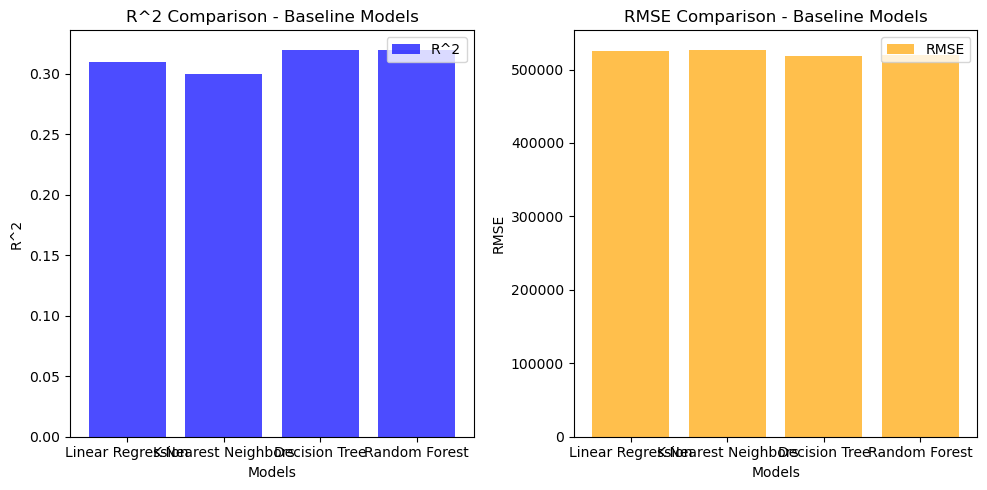

In [22]:
# BEGIN SOLUTION

import matplotlib.pyplot as plt
import numpy as np

# Define model names
baseline_models = ['Linear Regression', 'K-Nearest Neighbors', 'Decision Tree', 'Random Forest']  # Replace with actual model names

# Define performance metrics
r2_baseline = np.array([0.31, 0.30, 0.32, 0.32])  # Replace with actual R^2 values
rmse_baseline = np.array([524629.47, 527029.81, 518594.44, 519843.29])  # Replace with actual RMSE values

# Performance comparison across baseline models
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.bar(baseline_models, r2_baseline, color='blue', alpha=0.7, label='R^2')
plt.title('R^2 Comparison - Baseline Models')
plt.xlabel('Models')
plt.ylabel('R^2')
plt.legend()

plt.subplot(1, 2, 2)
plt.bar(baseline_models, rmse_baseline, color='orange', alpha=0.7, label='RMSE')
plt.title('RMSE Comparison - Baseline Models')
plt.xlabel('Models')
plt.ylabel('RMSE')
plt.legend()

plt.tight_layout()
plt.show()

# # END SOLUTION

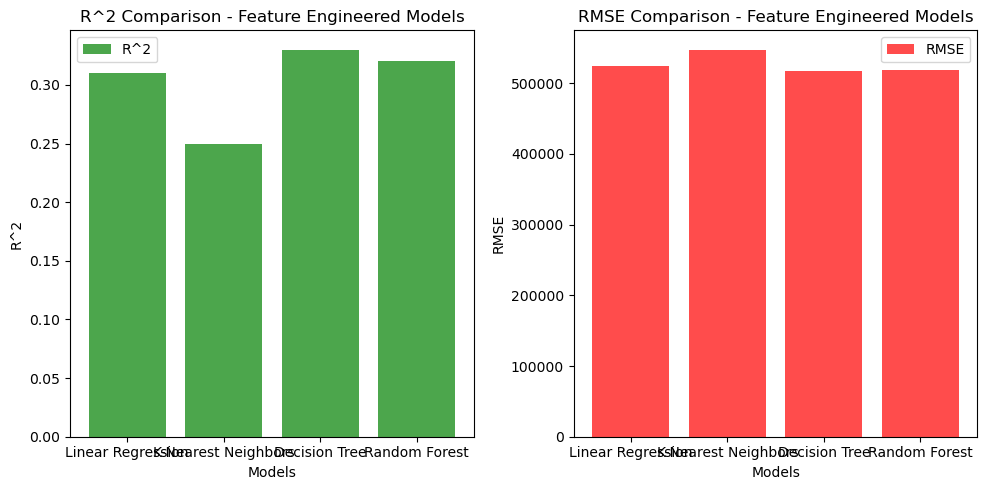

In [23]:
##Performance comparison across feature engineered models
import matplotlib.pyplot as plt
import numpy as np

feature_engineered_models = ['Linear Regression', 'K-Nearest Neighbors', 'Decision Tree', 'Random Forest']  # Replace with actual model names

r2_feature_engineered = np.array([0.31, 0.25, 0.33, 0.32])  # Replace with actual R^2 values
rmse_feature_engineered = np.array([524632.84, 547488.06, 517702.57, 519284.08])  # Replace with actual RMSE values

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.bar(feature_engineered_models, r2_feature_engineered, color='green', alpha=0.7, label='R^2')
plt.title('R^2 Comparison - Feature Engineered Models')
plt.xlabel('Models')
plt.ylabel('R^2')
plt.legend()

plt.subplot(1, 2, 2)
plt.bar(feature_engineered_models, rmse_feature_engineered, color='red', alpha=0.7, label='RMSE')
plt.title('RMSE Comparison - Feature Engineered Models')
plt.xlabel('Models')
plt.ylabel('RMSE')
plt.legend()

plt.tight_layout()
plt.show()

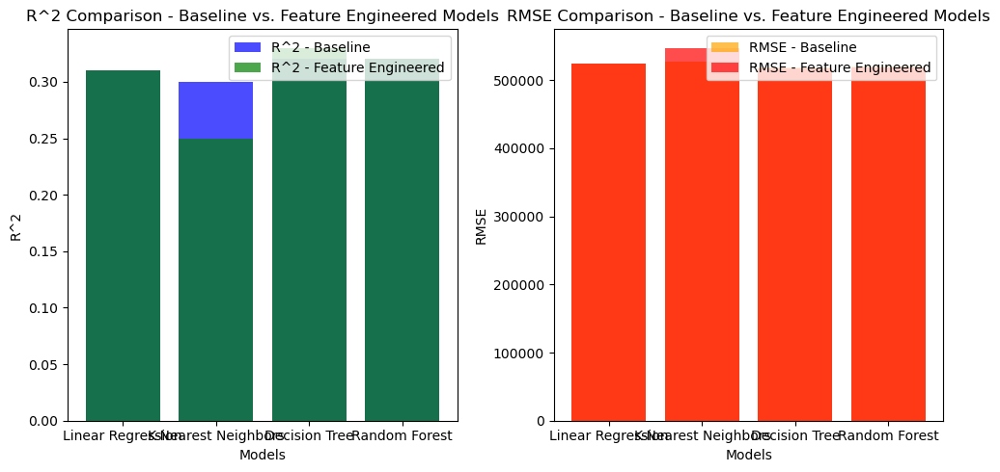

In [24]:
##Performance comparison of baseline and feature engineered models
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.bar(baseline_models, r2_baseline, color='blue', alpha=0.7, label='R^2 - Baseline')
plt.bar(feature_engineered_models, r2_feature_engineered, color='green', alpha=0.7, label='R^2 - Feature Engineered')
plt.title('R^2 Comparison - Baseline vs. Feature Engineered Models')
plt.xlabel('Models')
plt.ylabel('R^2')
plt.legend()

plt.subplot(1, 2, 2)
plt.bar(baseline_models, rmse_baseline, color='orange', alpha=0.7, label='RMSE - Baseline')
plt.bar(feature_engineered_models, rmse_feature_engineered, color='red', alpha=0.7, label='RMSE - Feature Engineered')
plt.title('RMSE Comparison - Baseline vs. Feature Engineered Models')
plt.xlabel('Models')
plt.ylabel('RMSE')
plt.legend()

plt.tight_layout()
plt.show()

### Problem 5.2:

**Write up** Summarize your results and provide some crucial insights about the entire with and without feature engineering process such as which model performed the best and why, based on what metrics and indicators, etc. Which model benefited the most/the least from the feature engineering (if any)?

**Answer here:** (feel free to make multiple cells!)
For Linear Regression, prior to Feature Engineering, the RMSE was 524629.47 and the R^2 was 0.31. Post Feature Engineering, the RMSE was 524632.84 and R^2 was 0.31.  

For K-Nearest Neighbors, prior to Feature Engineering, the RMSE was 527029.81 and the R^2 was 0.30. Post Feature Engineering, the RMSE was 547488.06 and the R^2 was 0.25. 

For Decision Tree, prior to Feature Engineering, the RMSE was 518594.44 and the R^2 was 0.32. Post Feature Engineering, the RMSE was 517702.57 and the R^2 was 0.33. 

For Random Forest Tree, prior to Feature Engineering, the RMSE was 519843.29 and the R^2 was 0.32. Post Feature Engineering, the RMSE was 519284.08 and the R^2 was 0.32. 

It appears that the Decision Tree post Feature Engineering has the best prediction on the models with a value of R^2 of 0.33, compared to other values of 0.25, 0.30, 0.31, and 0.32. Also, Decision Tree post Feature Engineerings has a RMSE value of 517702.57, compared to the higher values of the other models, indicating an lessened average amount of error than other models.
